# Clustering experiments on real datasets

We decided to use four datasets:
  - sequoia - a dataset consisting of coordinates of sequoias in California
  - birch1, birch2 and birch3 - datasets created as benchmarks for clustering algorithms
    - birch1 contains a grid of 100 clusters
    - birch2 contains 100 clusters arranged in a sinusoid
    - birch3 contains 100 clusters arranged randomly and having different sizes

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import os
import sys
import numpy as np
import pandas as pd
import time

sys.path.insert(0, os.path.join(os.getcwd(), "..", "kNN_NBC", "x64", "Release"))
import pynbc

In [2]:
matplotlib.rcParams['figure.figsize'] = [20, 15]

In [3]:
def run_dataset(dataset, name, k=None):
    print(f'Running dataset {name} with shape {dataset.shape}')
    k = k if k else int(len(dataset) ** 0.5)
    
    print('k =', k)
    
    start = time.time()
    knn_result = pynbc.nbc_kNN(k, pynbc.MIN_VALUE, dataset, True)
    end = time.time()
    knn_time = end - start
    
    start = time.time()
    kpnn_result = pynbc.nbc_kpNN(k, pynbc.MIN_VALUE, dataset, True)
    end = time.time()
    kpnn_time = end - start
    
    print('NBC with KNN runtime:', knn_time)
    print('NBC with K+NN runtime:', kpnn_time)
    
    plt.scatter(dataset[:,0], dataset[:,1], c=knn_result, marker='.')
    plt.title(f'{name}\nKNN results')
    plt.colorbar()
    plt.show()
    
    plt.scatter(dataset[:,0], dataset[:,1], c=kpnn_result, marker='.')
    plt.title(f'{name}\nK+NN results')
    plt.colorbar()
    plt.show()
    
    print('Differences between KNN and K+NN:', *np.where(np.array(knn_result) != kpnn_result))

## dataset: Sequoia 
https://www.researchgate.net/figure/Sequoia-dataset-10000_fig9_220387642

In [4]:
sequoia_dataset = pd.read_csv('data/points1.txt', header=None, sep=' ')
sequoia_dataset = np.array(sequoia_dataset, dtype=np.double)

Running dataset Sequoia with shape (62556, 2)
k = 250
NBC with KNN runtime: 7.312930107116699
NBC with K+NN runtime: 7.382143497467041


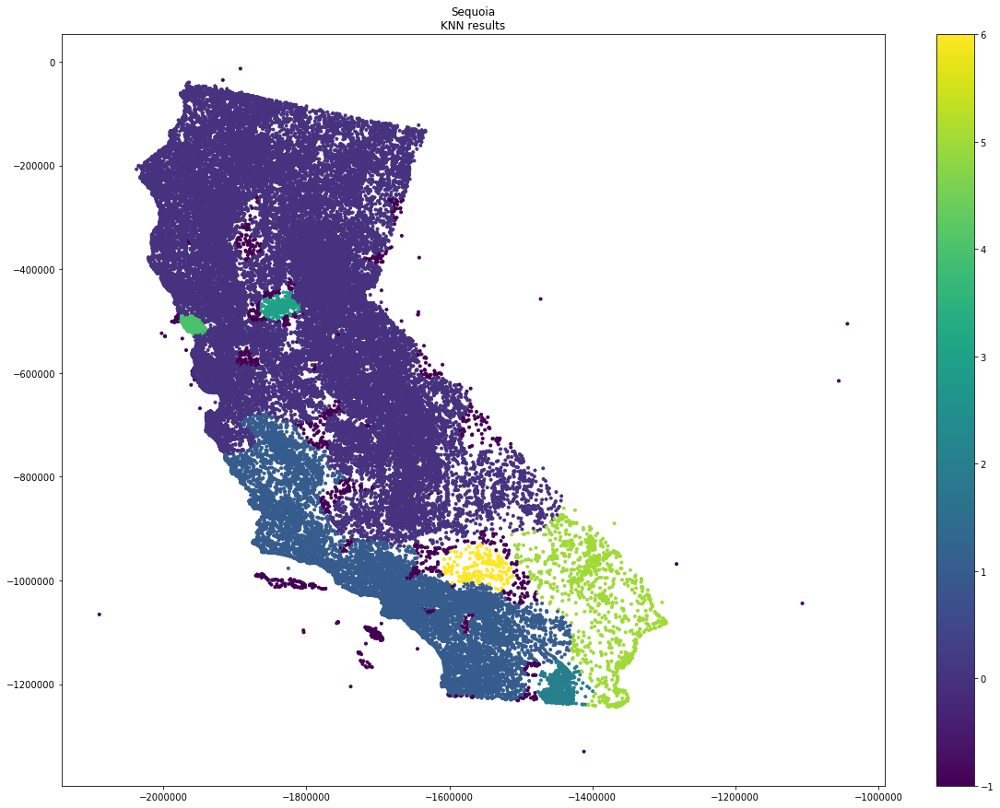

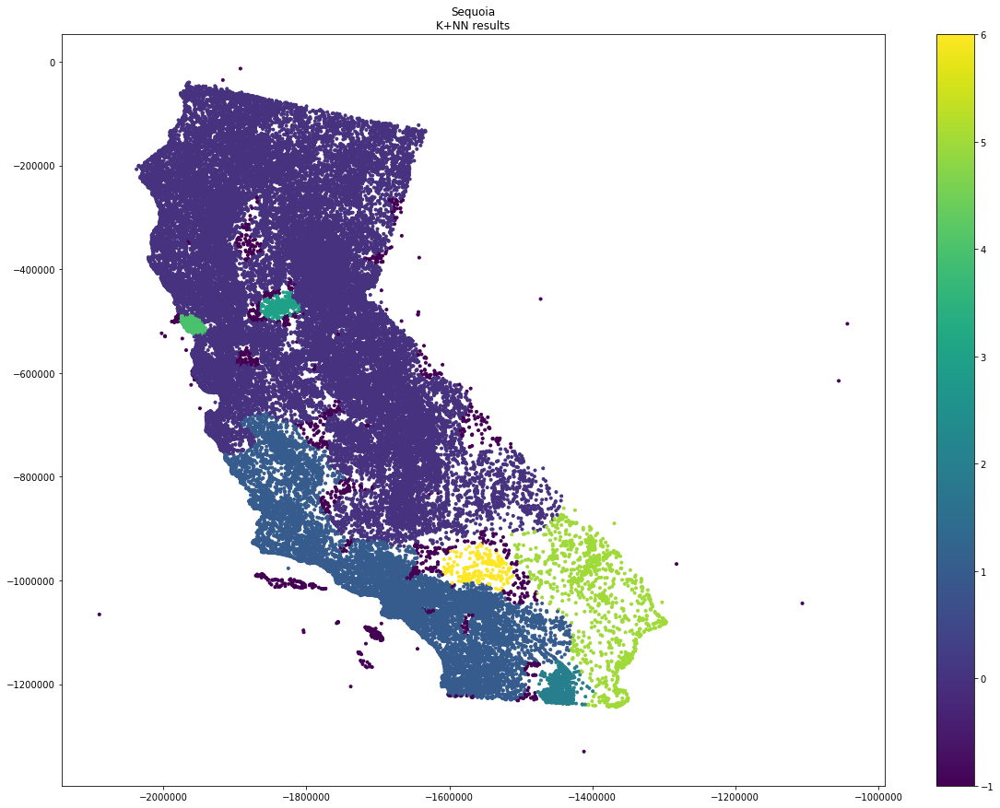

Differences between KNN and K+NN: [39081]


In [5]:
run_dataset(sequoia_dataset, 'Sequoia')

In [6]:
birch1_dataset = pd.read_csv('data/birch1.txt', header=None, sep=r"\s*")
birch1_dataset = np.array(birch1_dataset, dtype=np.double)

d:\projects\return-of-the-neighbours\rotn\lib\site-packages\ipykernel_launcher.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """Entry point for launching an IPython kernel.
d:\projects\return-of-the-neighbours\rotn\lib\site-packages\pandas\io\parsers.py:2455: FutureWarning: split() requires a non-empty pattern match.
  yield pat.split(line.strip())
d:\projects\return-of-the-neighbours\rotn\lib\site-packages\pandas\io\parsers.py:2458: FutureWarning: split() requires a non-empty pattern match.
  yield pat.split(line.strip())


Running dataset Birch1 with shape (100000, 2)
k = 316
NBC with KNN runtime: 31.64990758895874
NBC with K+NN runtime: 30.95512866973877


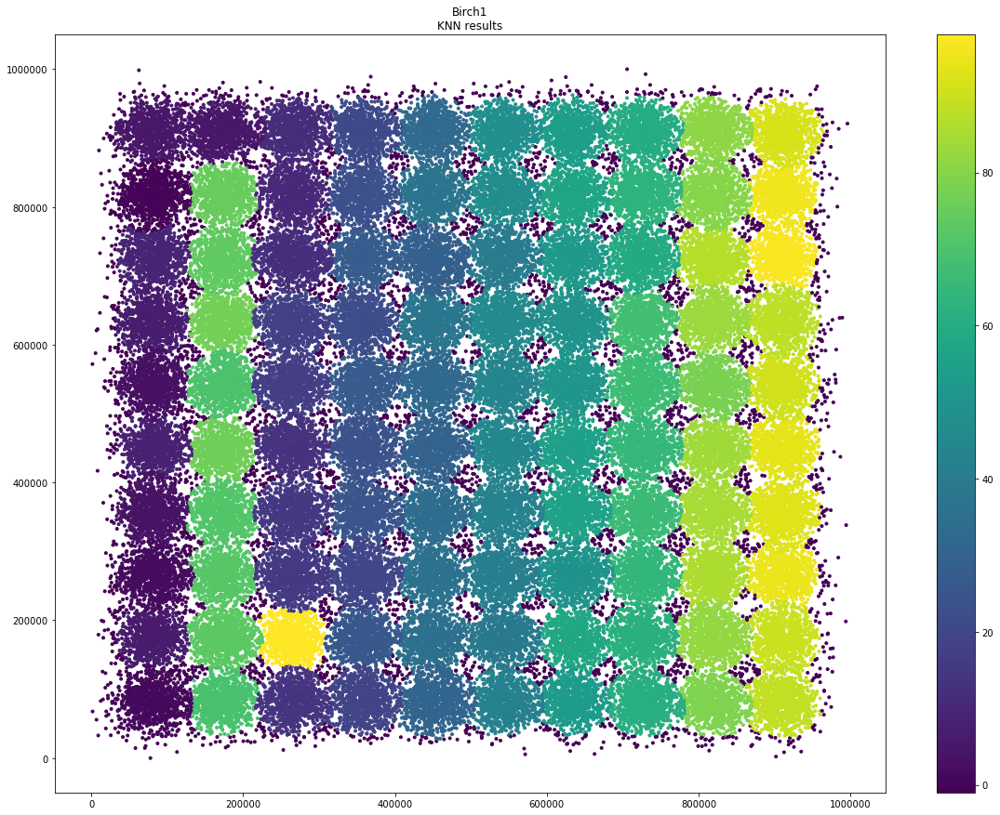

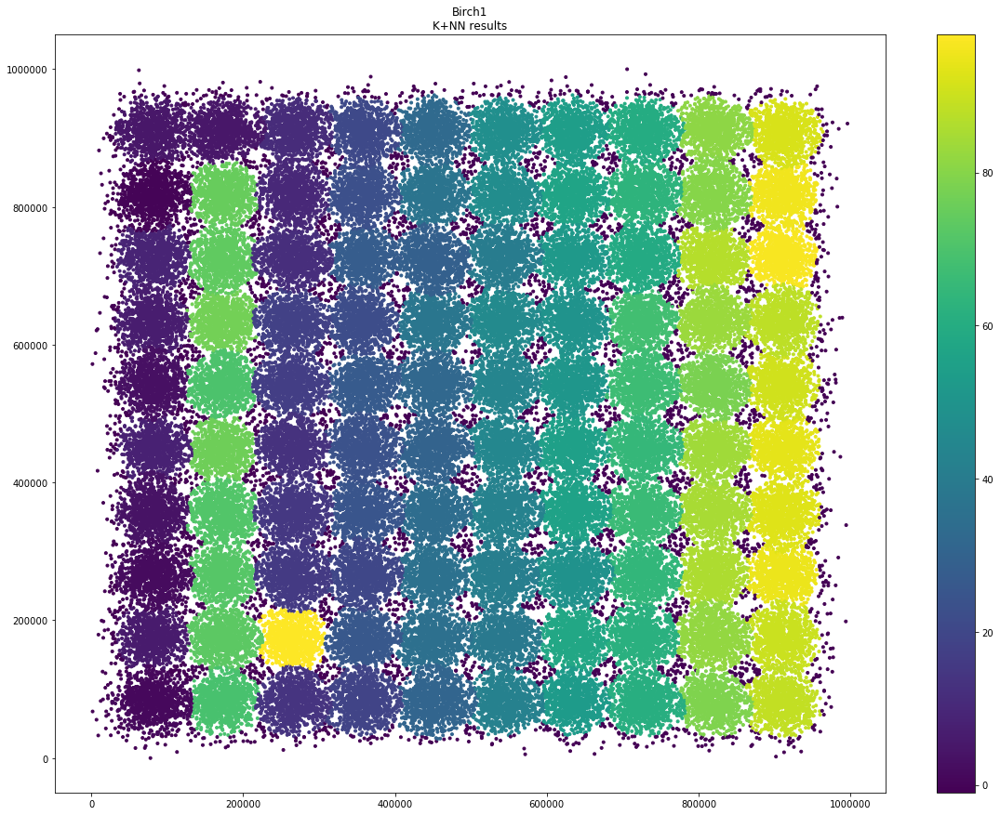

Differences between KNN and K+NN: []


In [7]:
run_dataset(birch1_dataset, 'Birch1')

In [8]:
birch2_dataset = pd.read_csv('data/birch2.txt', header=None, sep=r"\s*")
birch2_dataset = np.array(birch2_dataset, dtype=np.double)

d:\projects\return-of-the-neighbours\rotn\lib\site-packages\ipykernel_launcher.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """Entry point for launching an IPython kernel.


Running dataset Birch2 with shape (100000, 2)
k = 316
NBC with KNN runtime: 3.397033452987671
NBC with K+NN runtime: 3.5083298683166504


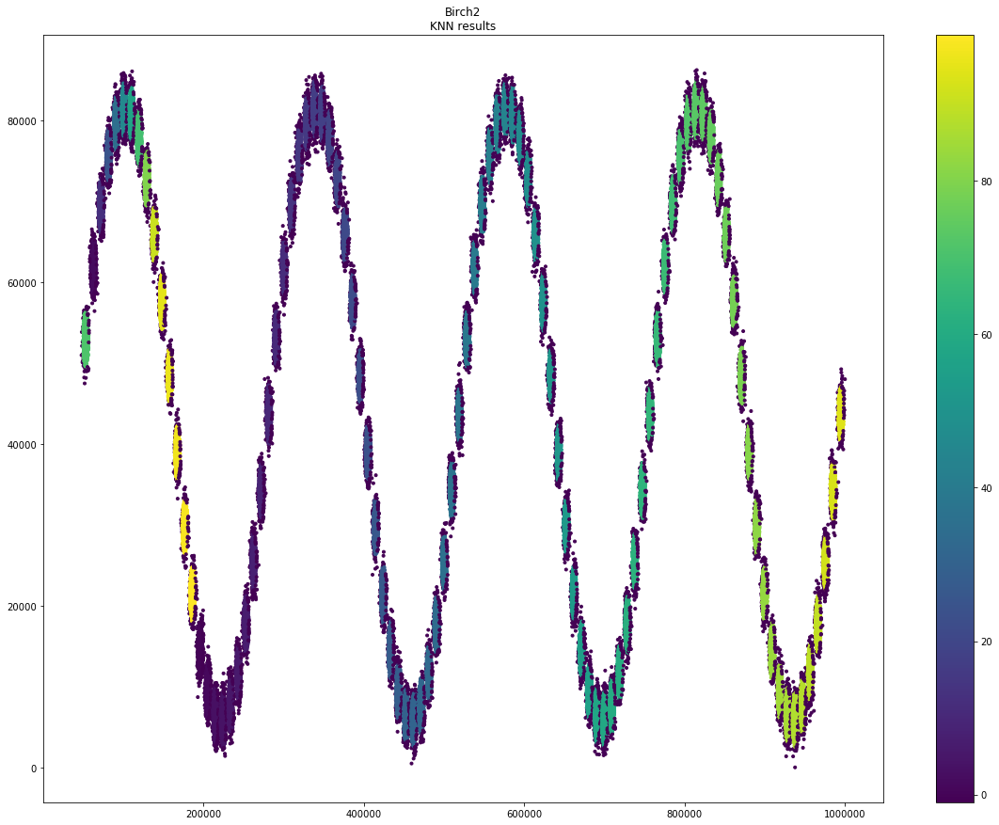

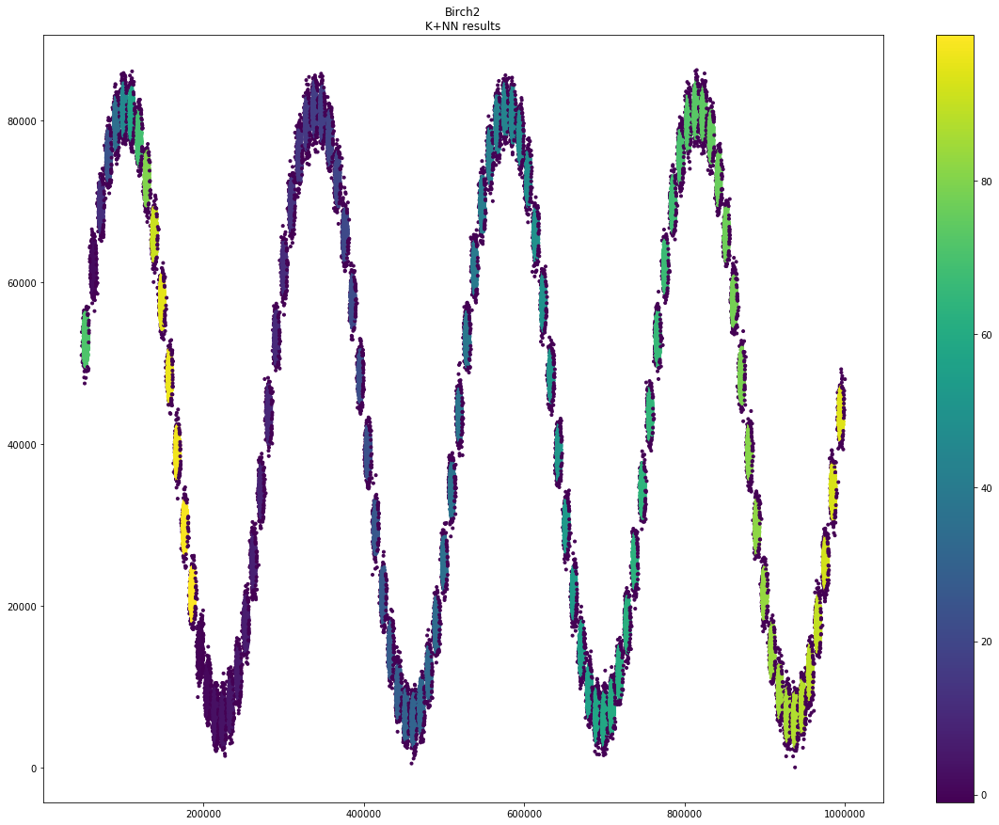

Differences between KNN and K+NN: []


In [9]:
run_dataset(birch2_dataset, 'Birch2')

In [10]:
birch3_dataset = pd.read_csv('data/birch3.txt', header=None, sep=r"\s*")
birch3_dataset = np.array(birch3_dataset, dtype=np.double)

d:\projects\return-of-the-neighbours\rotn\lib\site-packages\ipykernel_launcher.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """Entry point for launching an IPython kernel.


Running dataset Birch3 with shape (100000, 2)
k = 316
NBC with KNN runtime: 20.687527418136597
NBC with K+NN runtime: 20.88058829307556


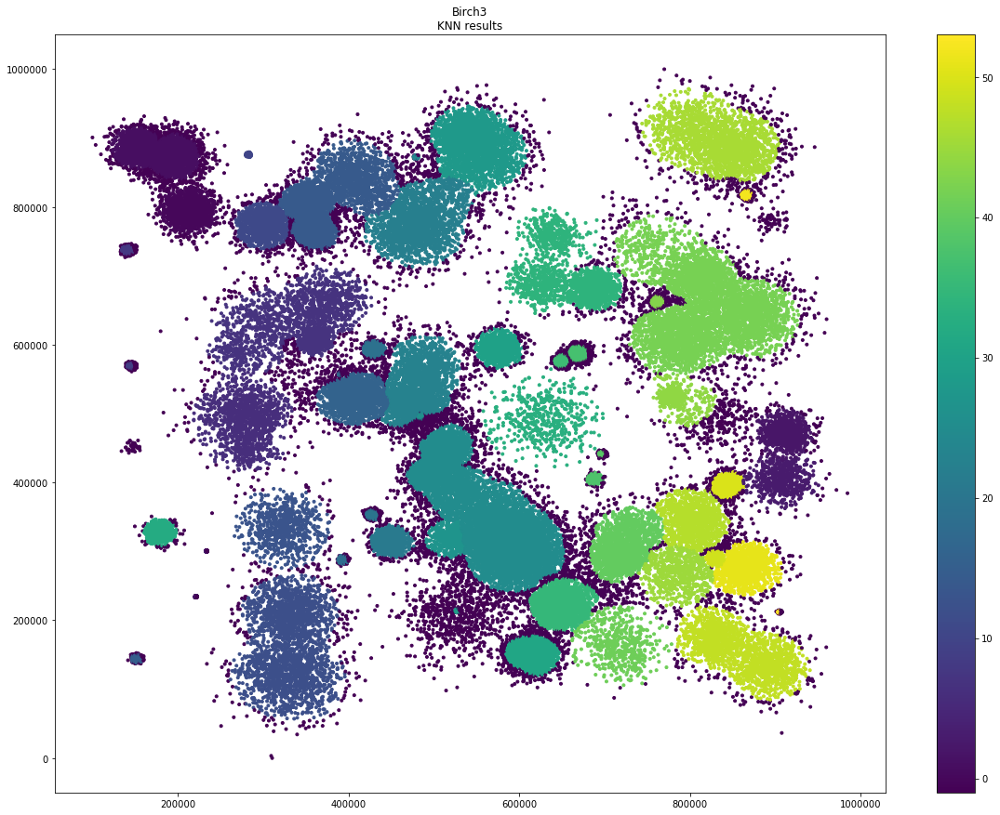

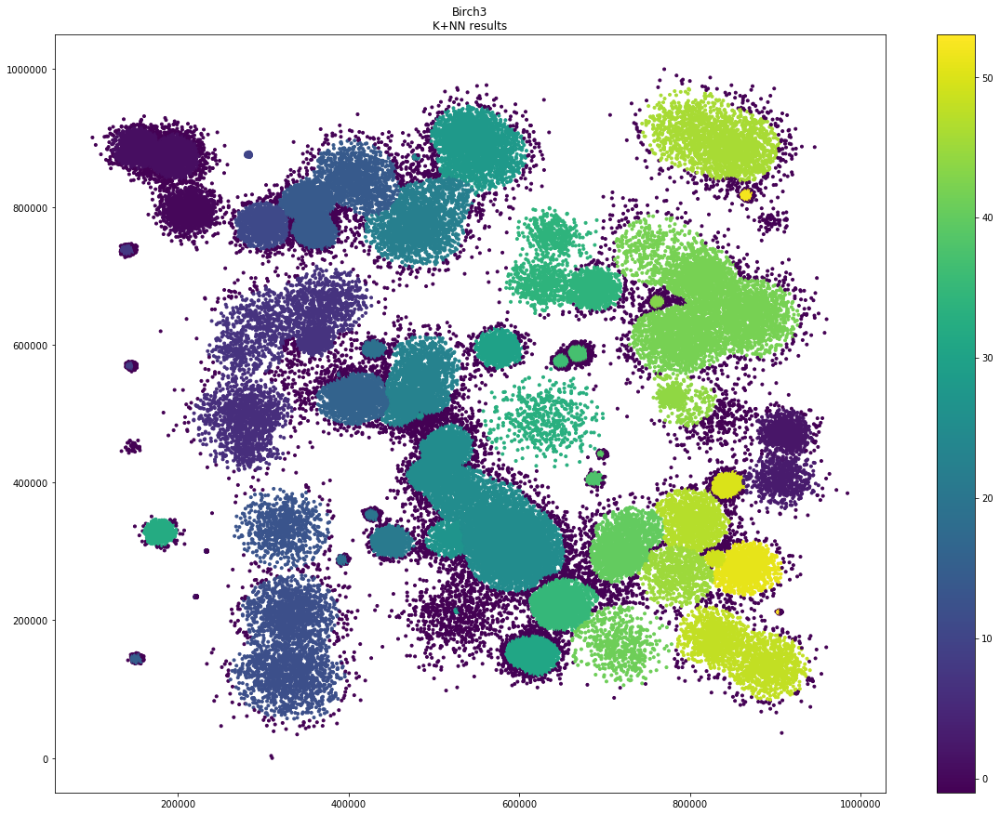

Differences between KNN and K+NN: []


In [11]:
run_dataset(birch3_dataset, 'Birch3')

As the algorithm merged some clusters, lesser values of k were used

Running dataset Birch3 (k=100) with shape (100000, 2)
k = 100
NBC with KNN runtime: 9.570451498031616
NBC with K+NN runtime: 9.74892807006836


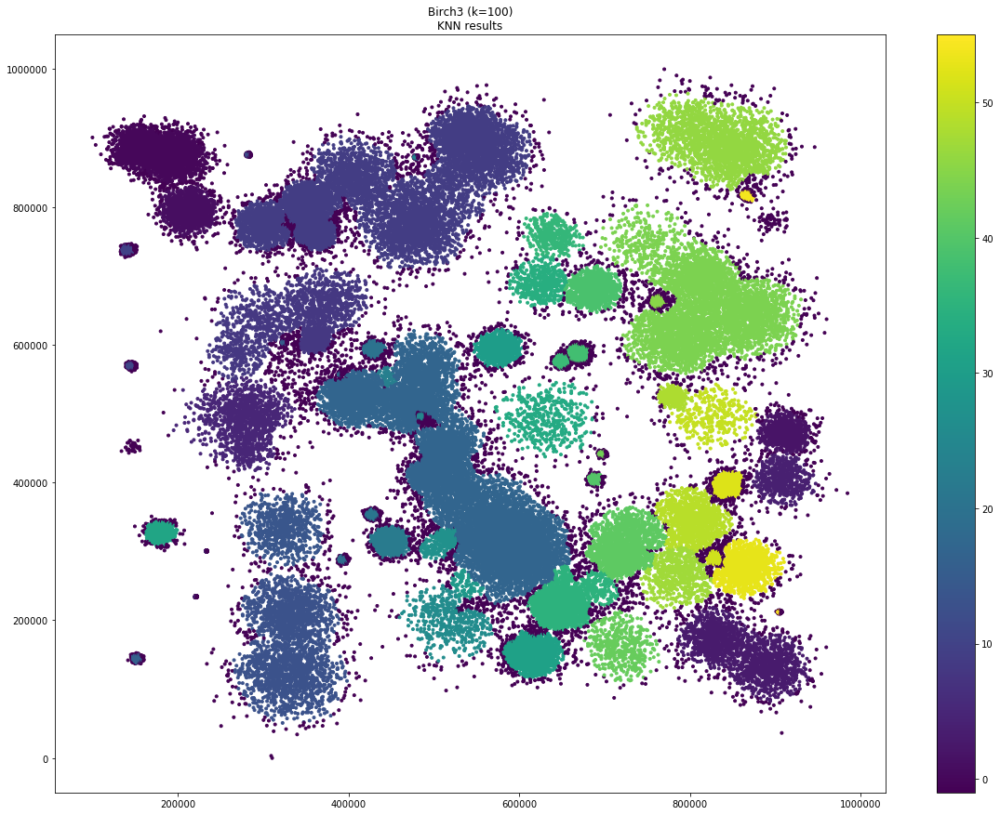

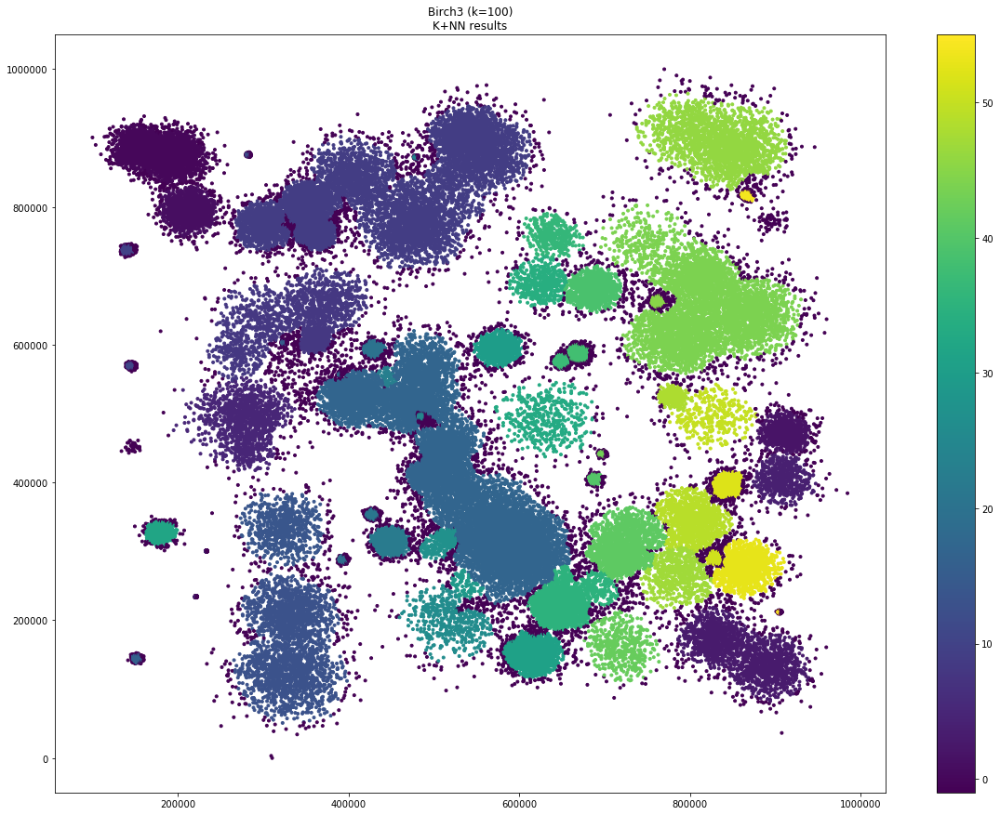

Differences between KNN and K+NN: []


In [12]:
run_dataset(birch3_dataset, 'Birch3 (k=100)', k=100)

Running dataset Birch3 (k = 50) with shape (100000, 2)
k = 50
NBC with KNN runtime: 5.674090623855591
NBC with K+NN runtime: 6.709927797317505


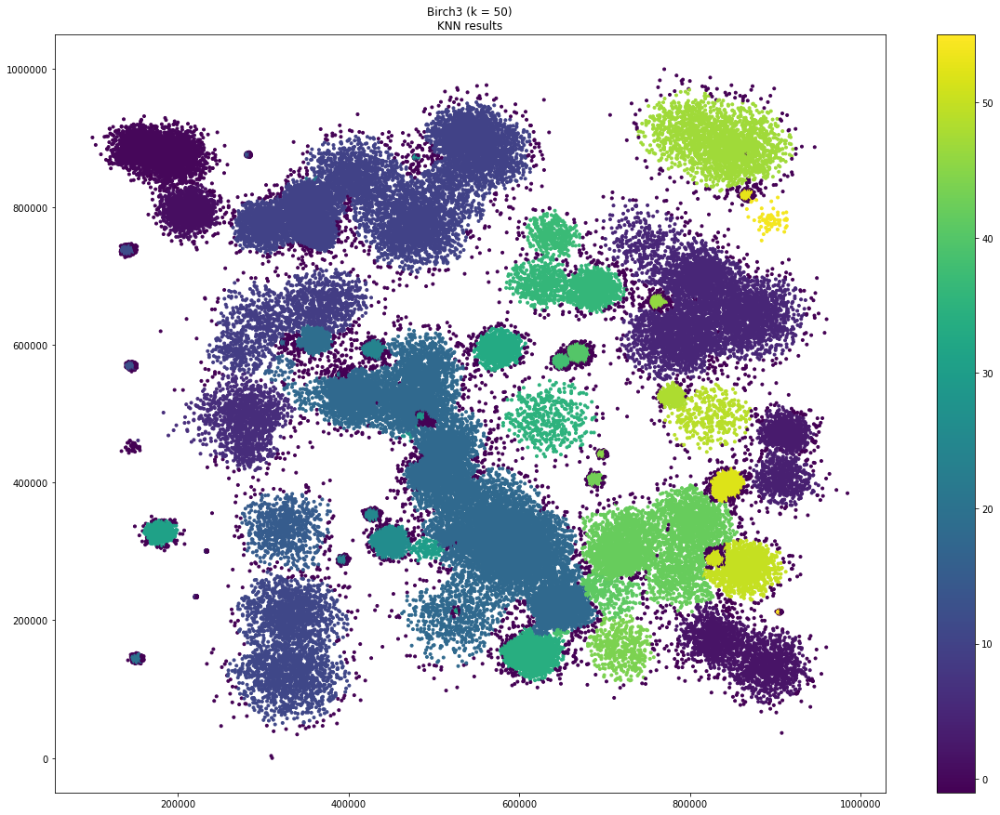

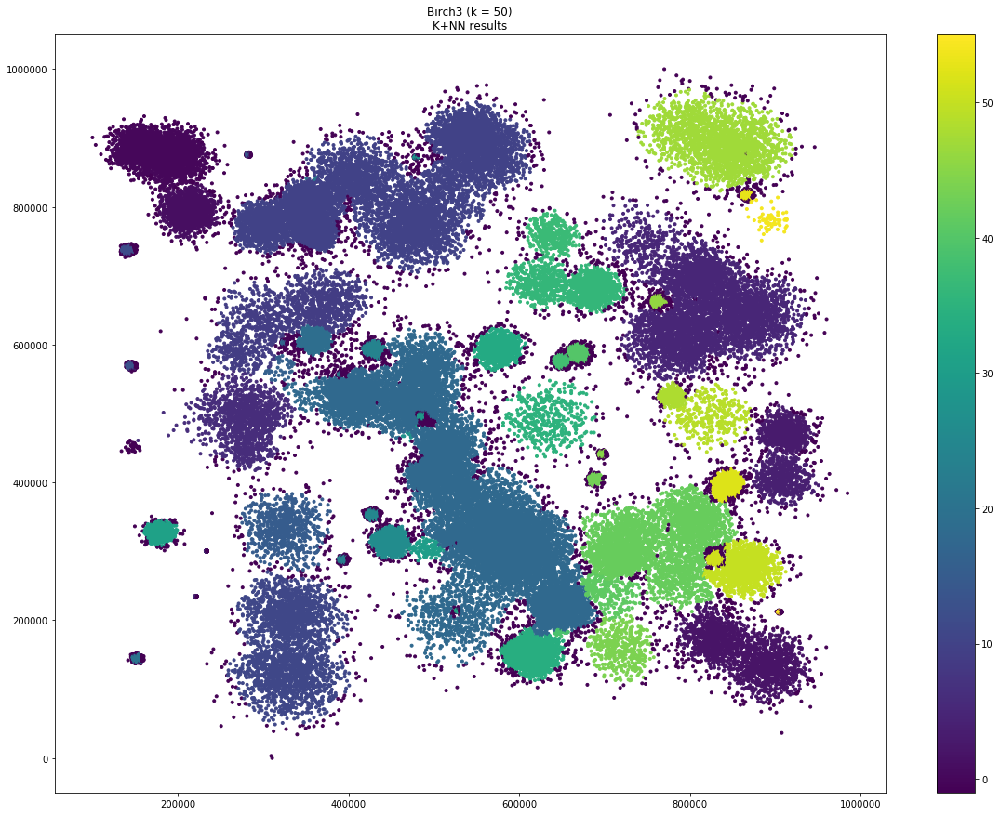

Differences between KNN and K+NN: []


In [13]:
run_dataset(birch3_dataset, 'Birch3 (k = 50)', k=50)

Running dataset Birch3 (k=25) with shape (100000, 2)
k = 25
NBC with KNN runtime: 4.01668119430542
NBC with K+NN runtime: 3.828181266784668


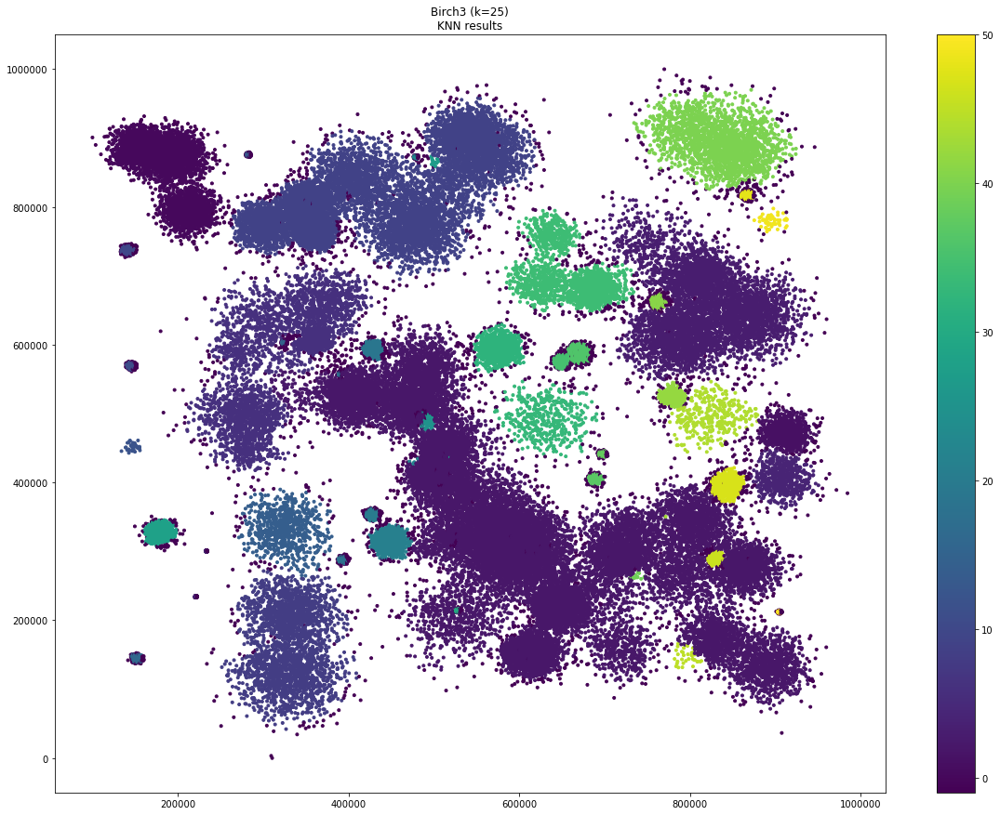

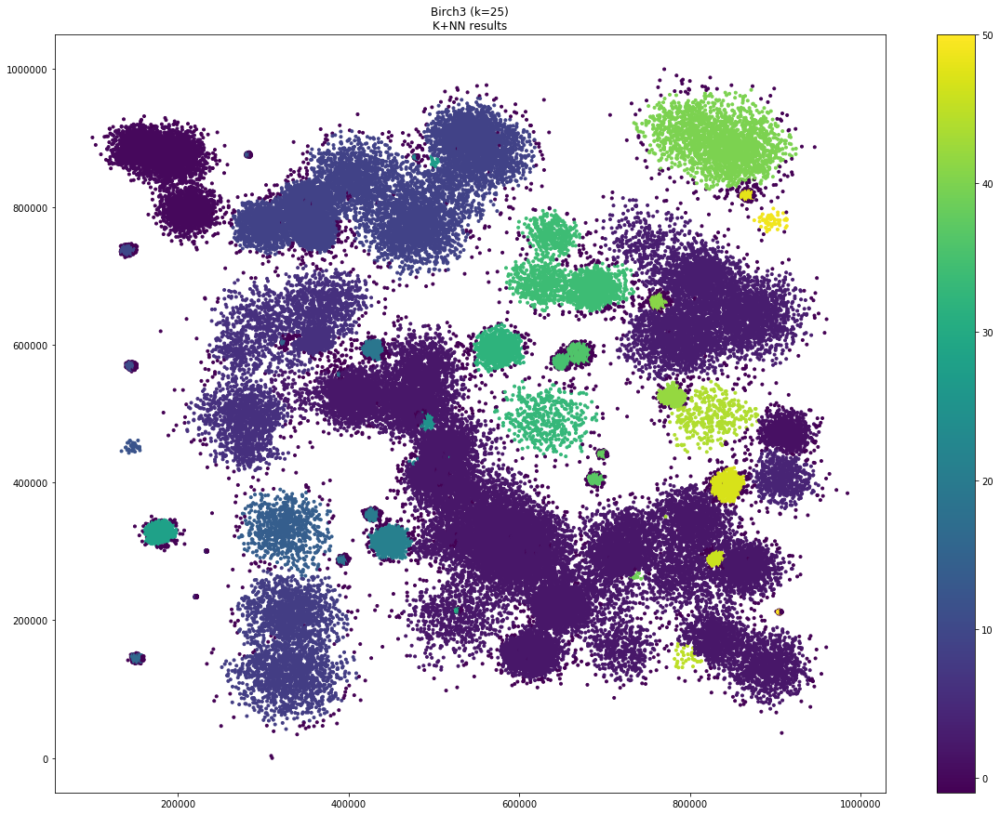

Differences between KNN and K+NN: []


In [14]:
run_dataset(birch3_dataset, 'Birch3 (k=25)', k=25)

Running dataset Birch3 (k=10) with shape (100000, 2)
k = 10
NBC with KNN runtime: 2.013542652130127
NBC with K+NN runtime: 2.1216421127319336


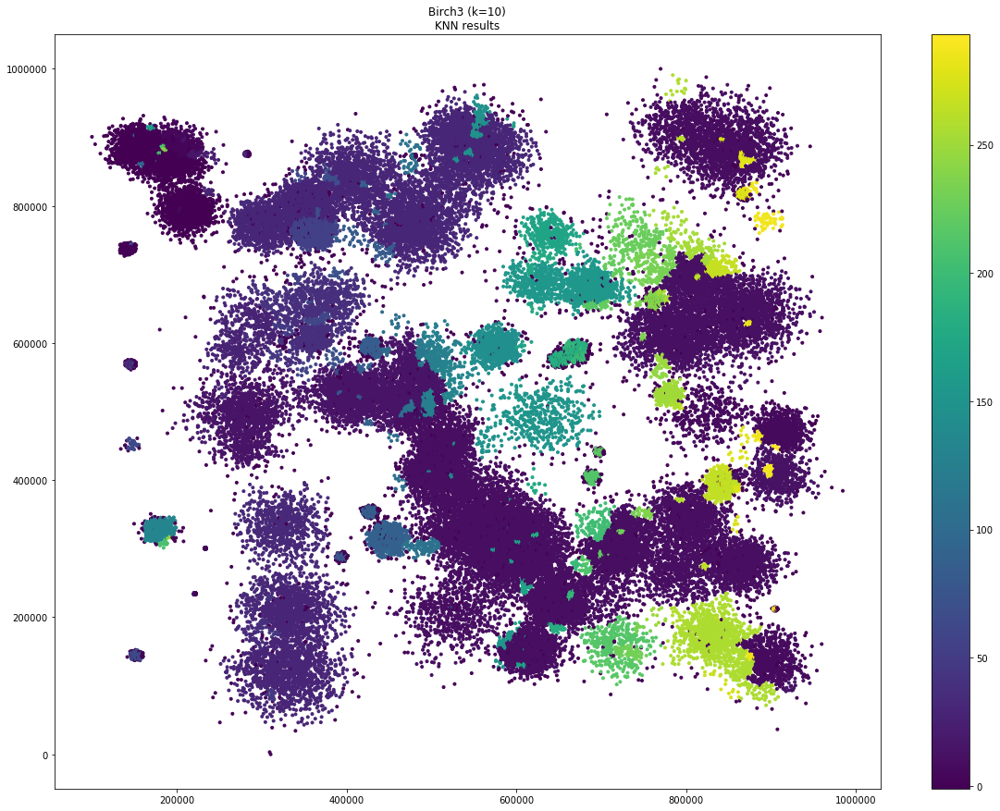

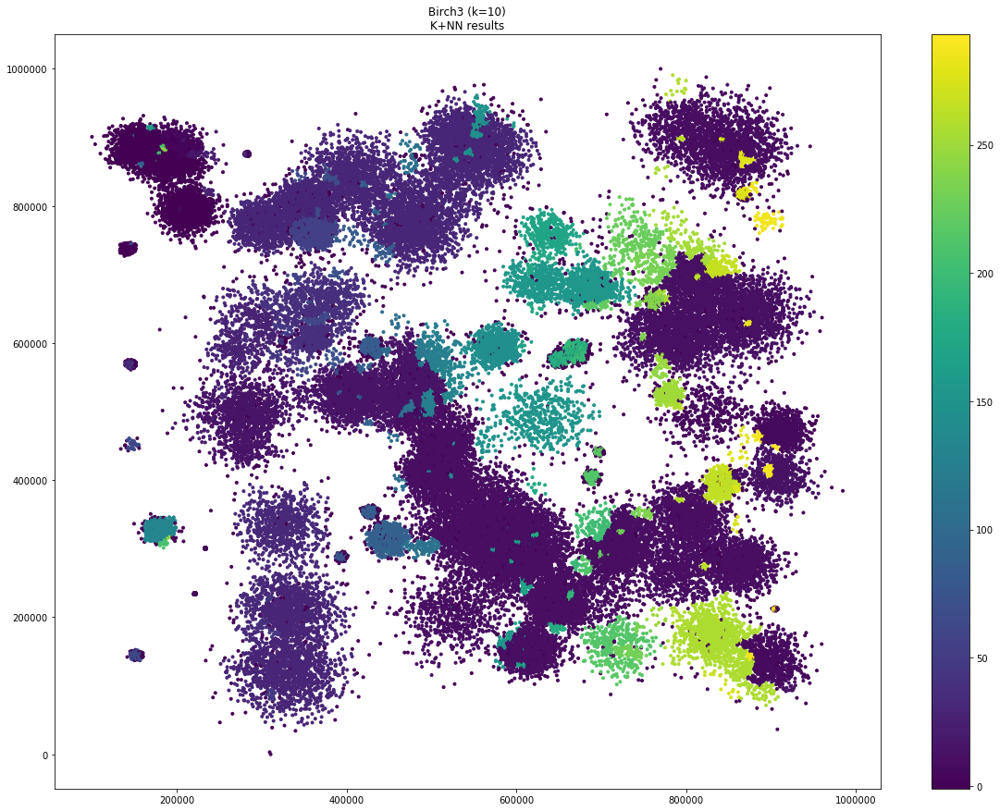

Differences between KNN and K+NN: []


In [15]:
run_dataset(birch3_dataset, 'Birch3 (k=10)', k=10)